## Fit hanger S21
This notebook fits hanger resonance.

In [2]:
%matplotlib notebook
import qcodes as qc
import numpy as np
import sys, os
sys.path.append("..")
from analysis.characterizations.characterizations import resonators as res
from qcodes.dataset.plotting import plot_by_id
from qcodes.dataset.data_set import load_by_id
from analysis.characterizations.characterizations.fitter import fit

import matplotlib.pyplot as plt

### loading data
Qcodes data loading. Set the database path and do some hacky reshaping to get the right data array back.

In [3]:
dbpath = r"D:\data\181214 SR001\experiments.db"

qc.initialise_database()
qc.dataset.database.initialise_or_create_database_at(dbpath)
qc.dataset.database.get_DB_location()
"""
Loads data given that there is some second parameter that you sweep over. In the case of 18-12-2018 this was the power. 
params:
    Npoints reshapes the data again by the amount of averages per trace. e.g creates a 3rd dimension
    load_temperature: Added as optional because sometimes the T measurement didn't work so to save time in the fridge i didnt save it
    
"""
def load_data(id_data, Npoints, load_temperature=True, correct_cut_off_data=True):
    ds1=qc.load_by_id(id_data)
    f1=np.array(ds1.get_values("frequency"))
    n_sweep = np.argmax(f1)+1 #amount of points per single trace
    if correct_cut_off_data:
        i_max = int(np.floor(np.shape(f1)[0] / (Npoints * n_sweep)) * (Npoints * n_sweep))
    else:
         i_max = -1   
    f1=f1[0:i_max].reshape(-1,Npoints,n_sweep)
    #hp1=np.array(ds1.get_values("heater_power"))
    #hp1=hp1.reshape(-1,np.argmax(f1)+1)
    P1=np.array(ds1.get_values("Pow_S21"))[0:i_max]
    P1=P1.reshape(-1,Npoints,n_sweep)
    phase1=np.array(ds1.get_values("Phase_S21"))[0:i_max]
    phase1=phase1.reshape(-1,Npoints,n_sweep)
    S21 = (np.array(ds1.get_values("Re_S21")) + 1j * np.array(ds1.get_values("Im_S21")))[0:i_max]
    S21 = S21.reshape(-1,Npoints,n_sweep)
    if load_temperature:
        T = np.array(ds1.get_values("temperature"))[0:i_max]
        T = T.reshape(-1,Npoints,n_sweep)
        return f1, P1, phase1, S21, T
    else:        
        return f1, P1, phase1, S21




## fitting and plotting temperature sweeps
The temperature sweeps were id: 

id: 97, 29 sweeps for the downgoing T sweep

id: 98, 46 sweeps for the upgoing T sweep. 

In [4]:
N = 29 #set the amount of sweeps
db_id = 97 #set the database id
f, P, phase, S21, T = load_data(db_id, N)
print(np.shape(f))

(1, 29, 25001)


<IPython.core.display.Javascript object>


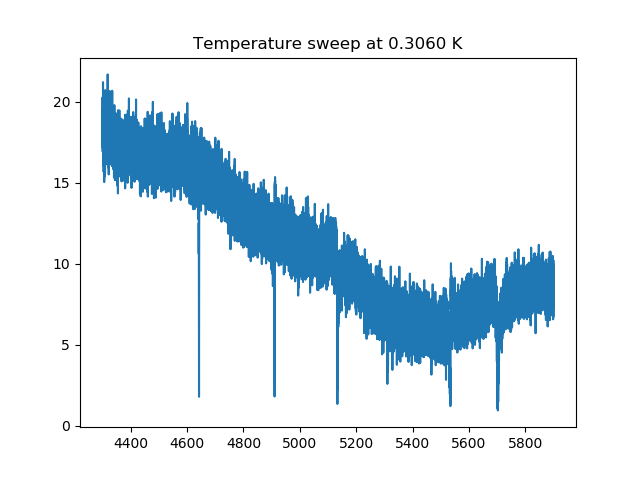

Text(0.5, 1.0, 'Temperature sweep at 0.3060 K')

In [24]:
freqs = f[0,0,:]
#instead of averaging per power over multiple sweeps here we just did multiple sweeps in time. 
#therefore the first index(normally power) has dimension 1. The second index would be the amount of time to repeat the measurement 
# but since T changes in time this is then just taken as the sweep at a certain temperature. 
T_ind = 28
temperatures = T[0,:, 0]
S21_sweep = S21[0,T_ind,:]
temperature = T[0,T_ind, 0]
plt.figure()
plt.plot(freqs,np.abs(S21_sweep))

plt.title('Temperature sweep at %.4f K' % temperatures[T_ind])


(1, 29, 25001)


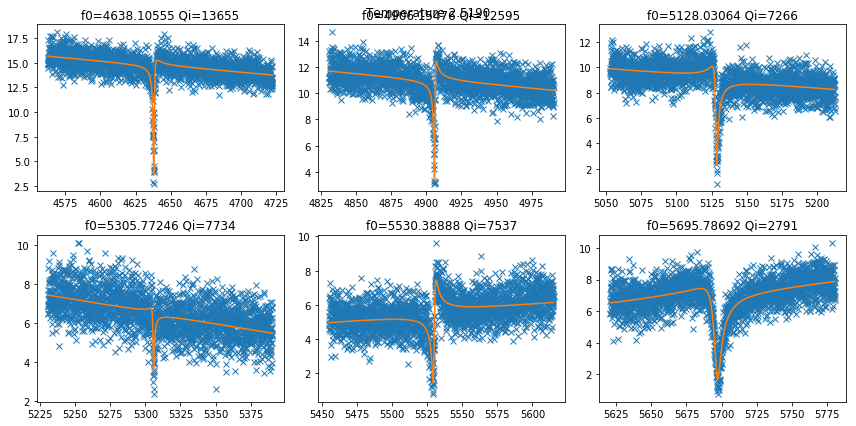

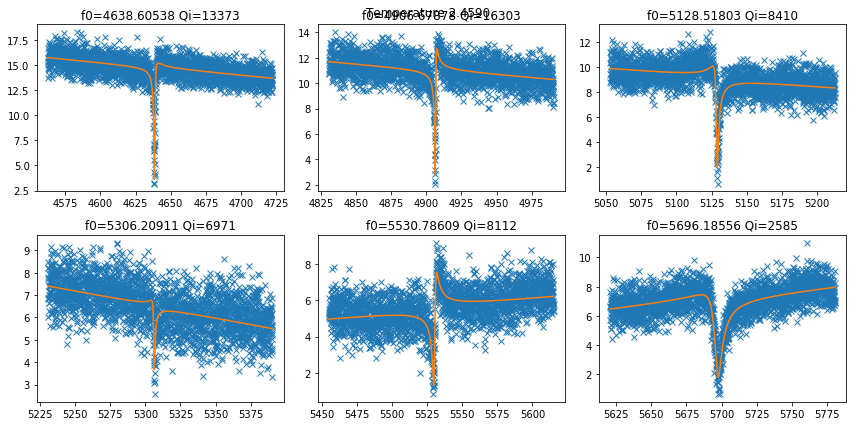

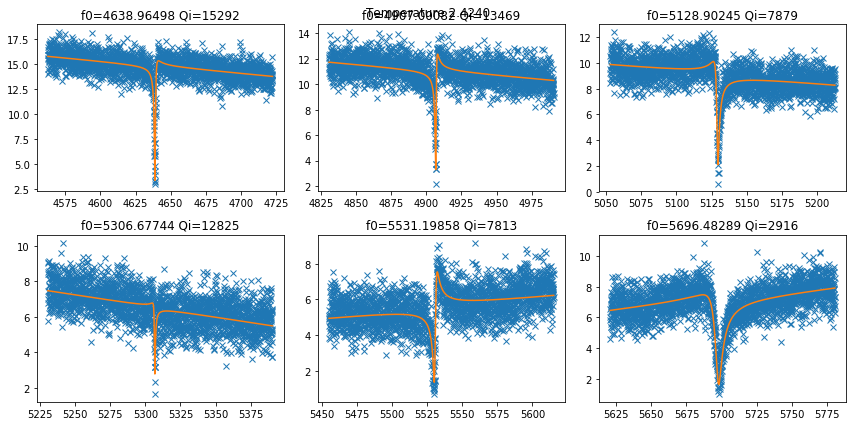

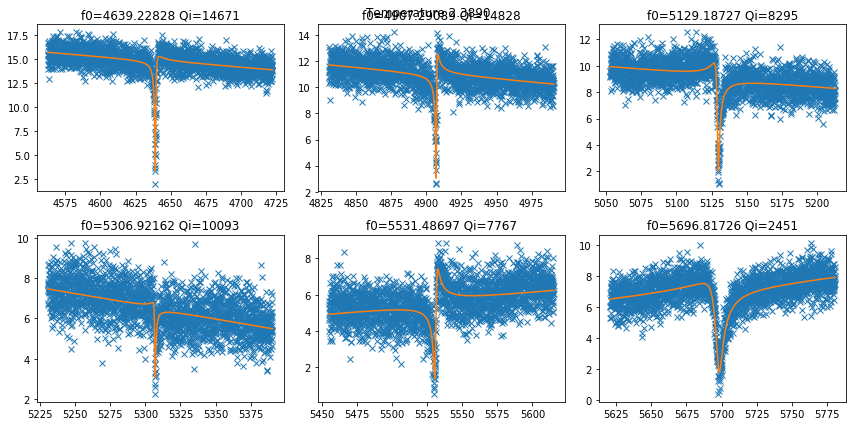

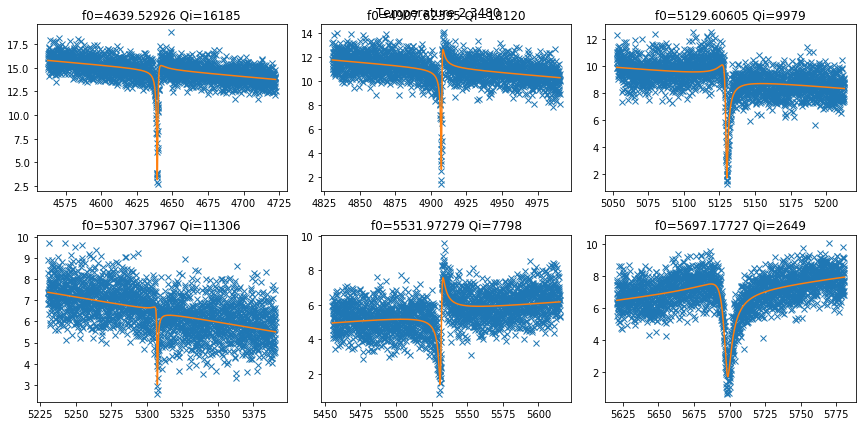

...

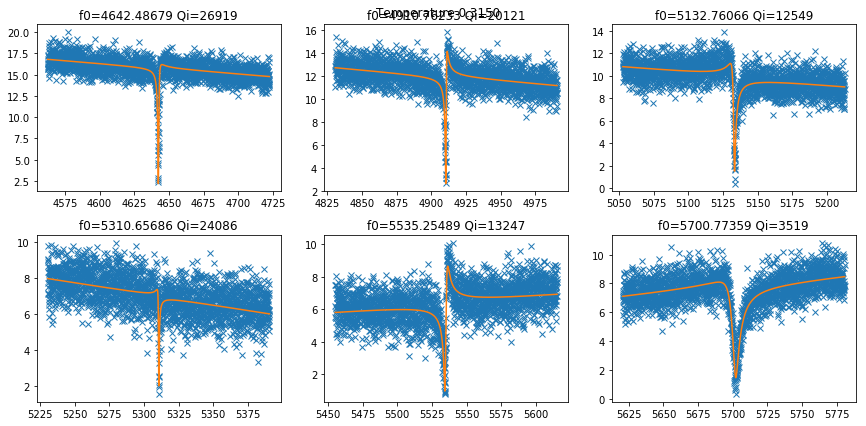

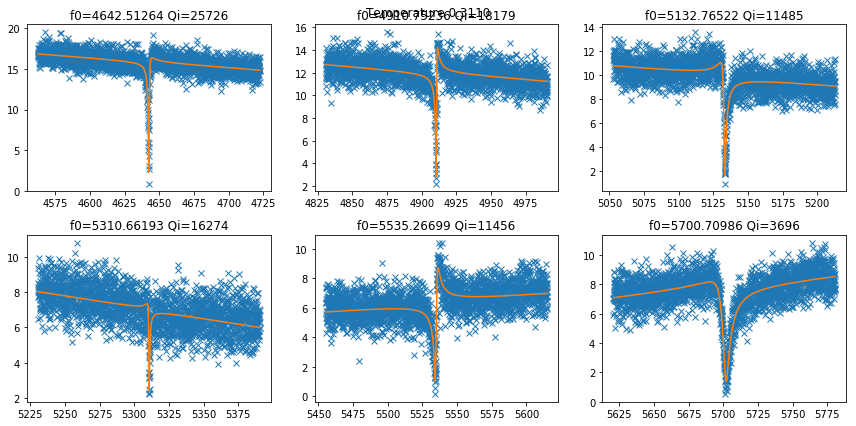

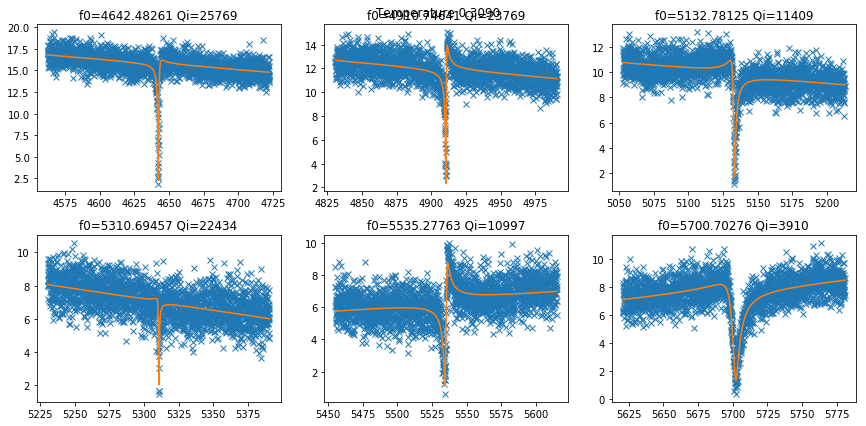

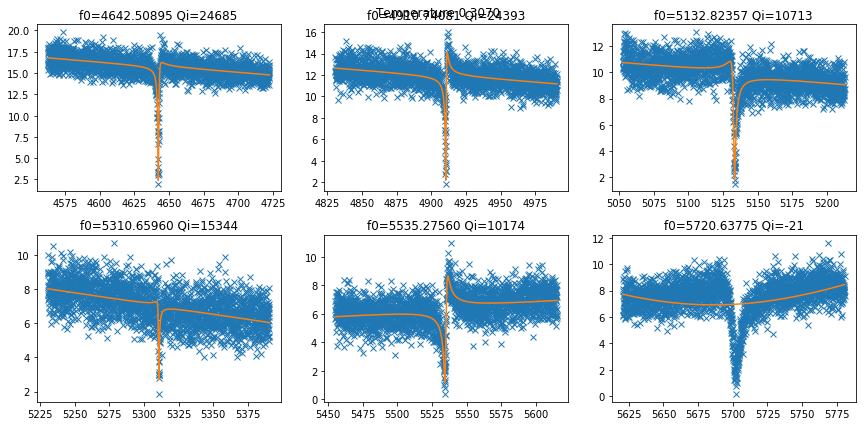

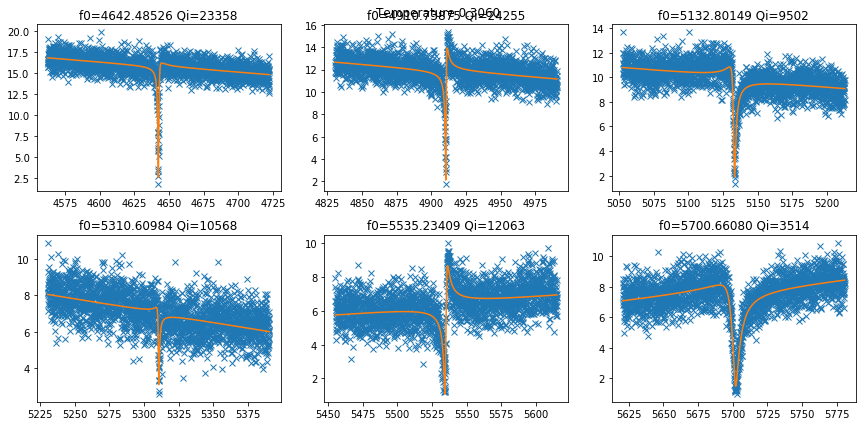

In [39]:
#now let's get the single resonances from the plot. 
%matplotlib inline
N = 29 #set the amount of sweeps
db_id = 97 #set the database id
f, P, phase, S21, T = load_data(db_id, N)
print(np.shape(f))
df = 80
freqs = f[0,0,:]
temperatures = T[0,:, 0]

Qi = np.zeros((6,len(temperatures)))
Qc = np.zeros((6,len(temperatures)))
f0 = np.zeros((6,len(temperatures)))
Qi_err = np.zeros((6,len(temperatures)))
Qc_err = np.zeros((6,len(temperatures)))
f0_err = np.zeros((6,len(temperatures)))

for T_ind in range(len(temperatures)):
    S21_sweep = S21[0,T_ind,:]
    f0s = np.array([4642.48477419, 4910.73860518, 5132.80162742, 5310.60959337,
       5535.23310231, 5700.67908268])
    plt.figure(figsize=(12,6))
    for i in range(len(f0s)):
        plt.subplot(2,3,i+1)
        #get the range of frequencies around f0
        indices = np.where((freqs > f0s[i] - df) & (freqs < f0s[i] + df))
        freq_slice = freqs[indices]
        plt.plot(freq_slice, np.abs(S21_sweep[indices]), 'x' )
        pars, result, hanger_model, fit_report = res.fit_hanger(freq_slice, S21_sweep[indices], True, fit_report=False) #p0_sloped)
        plt.plot(freq_slice,np.abs(res.hanger_S21_sloped(*[pars[key].value for key in pars.valuesdict()][0:9])))
        plt.title('f0=%.5f Qi=%d' % (pars['f0'].value,pars['Qi'].value))
        
        Qi[i,T_ind] = pars['Qi'].value
        Qc[i,T_ind] = pars['Qc'].value
        f0[i,T_ind] = pars['f0'].value
        Qi_err[i,T_ind] = pars['Qi'].stderr
        Qc_err[i,T_ind] = pars['Qc'].stderr
        f0_err[i,T_ind] = pars['f0'].stderr
        
    plt.suptitle('Temperature %.4f' % temperatures[T_ind])
    plt.tight_layout()

(1, 29, 25001)


Text(0.5, 1.0, 'Temperature dependence of external Q')

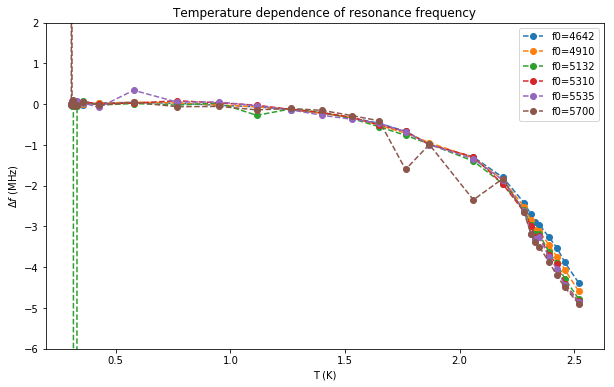

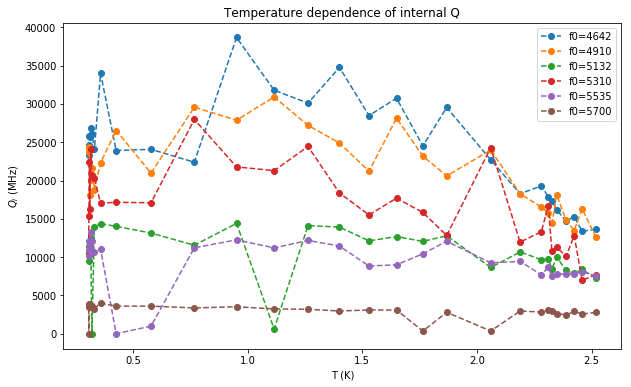

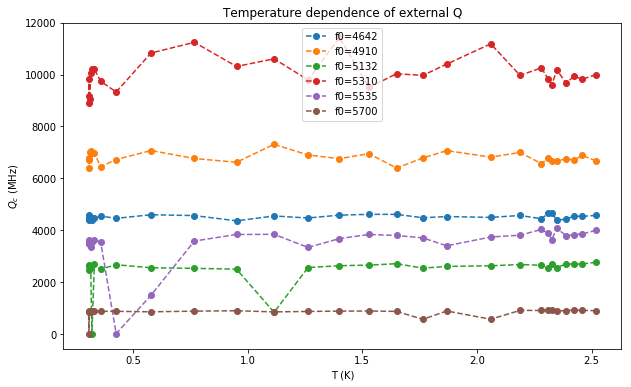

In [49]:
N = 29 #set the amount of sweeps
db_id = 97 #set the database id
f, P, phase, S21, T = load_data(db_id, N)
print(np.shape(f))
df = 80
freqs = f[0,0,:]
temperatures = T[0,:, 0]

plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,f0[i,:]-f0s[i],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylim(-6,2)
plt.ylabel('$\Delta f$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of resonance frequency')

plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,Qi[i,:],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylabel('$Q_i$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of internal Q')

plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,Qc[i,:],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylabel('$Q_c$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of external Q')

# Now do the same for the other sweep

(1, 46, 35001)


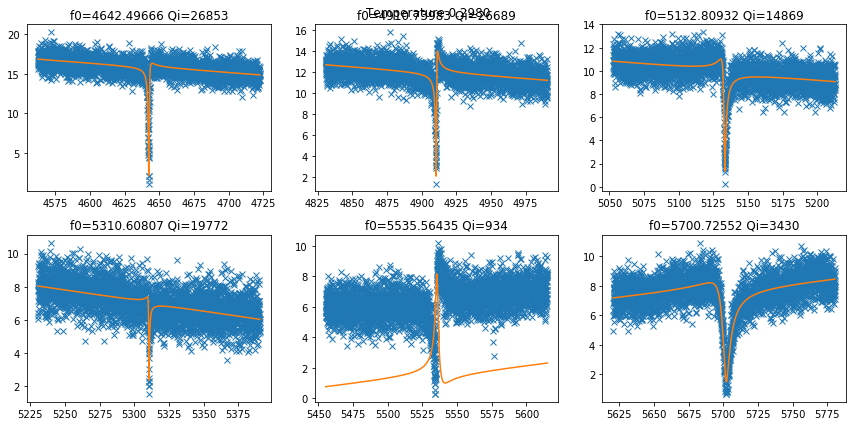

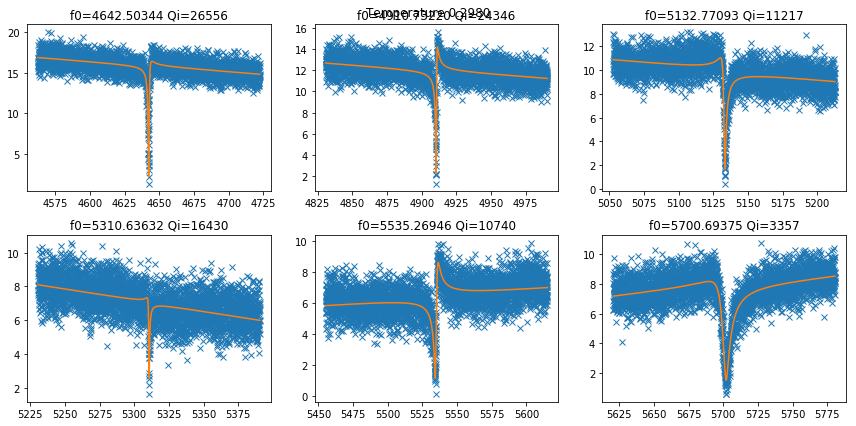

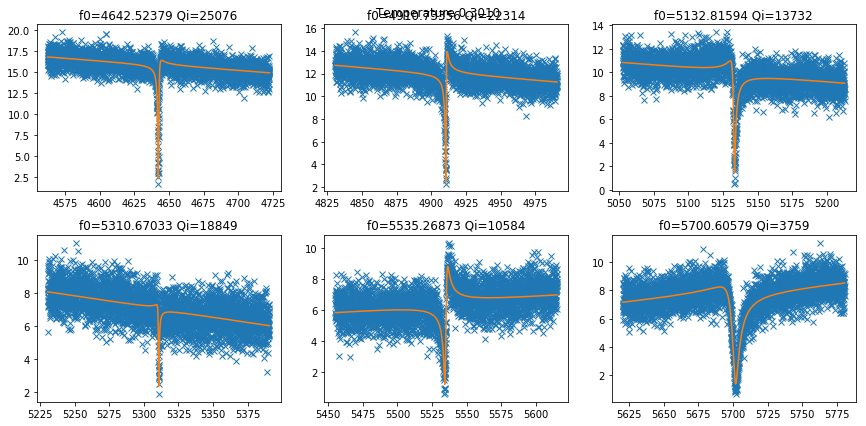

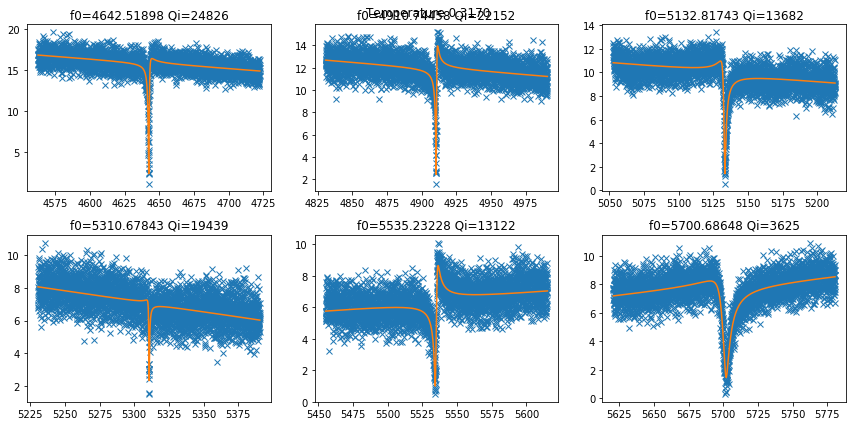

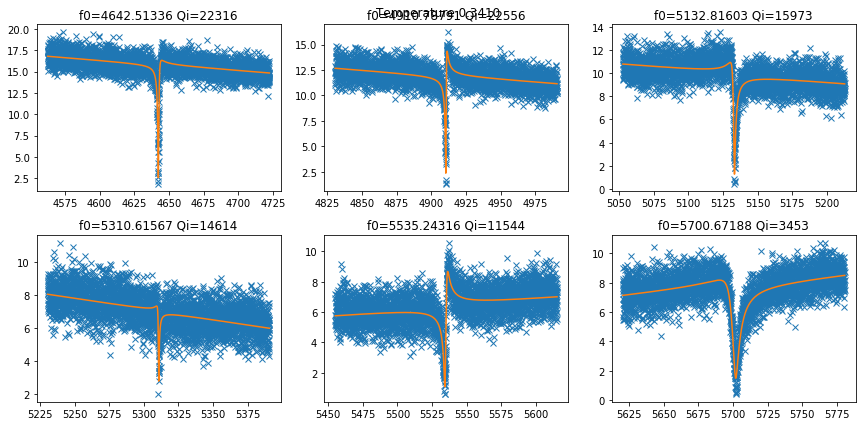

...

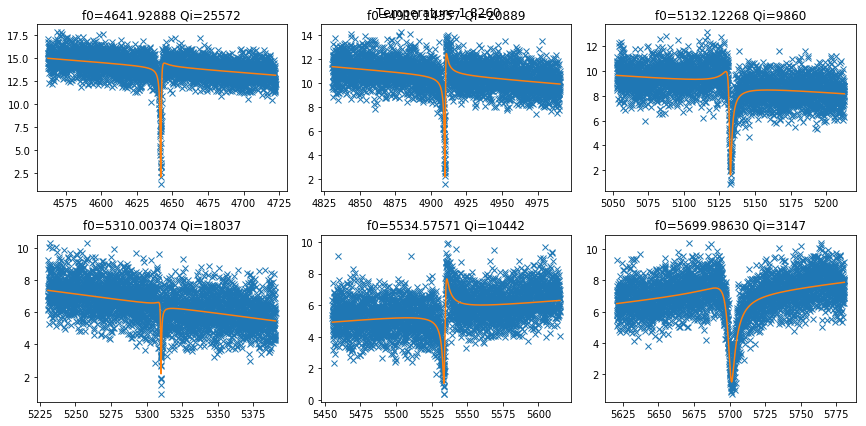

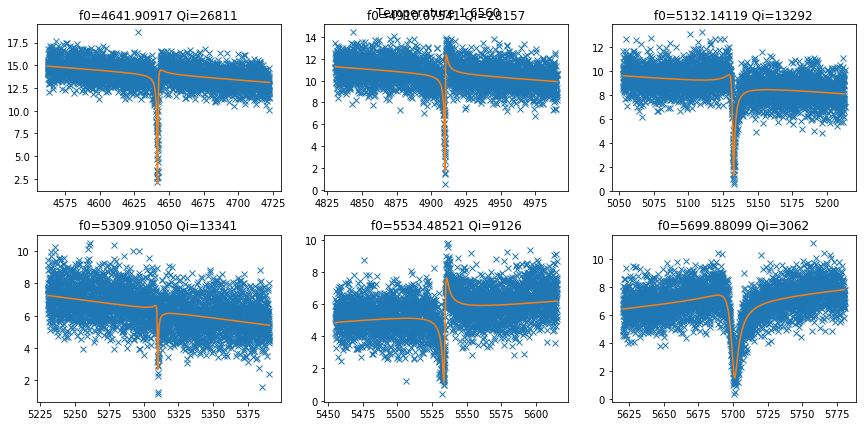

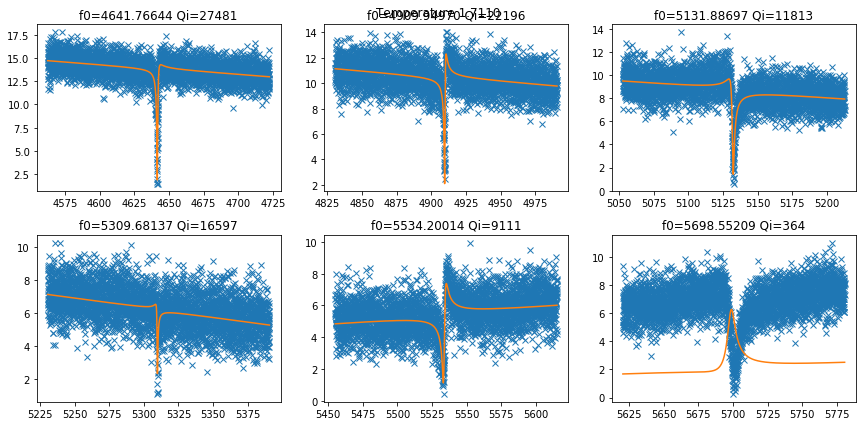

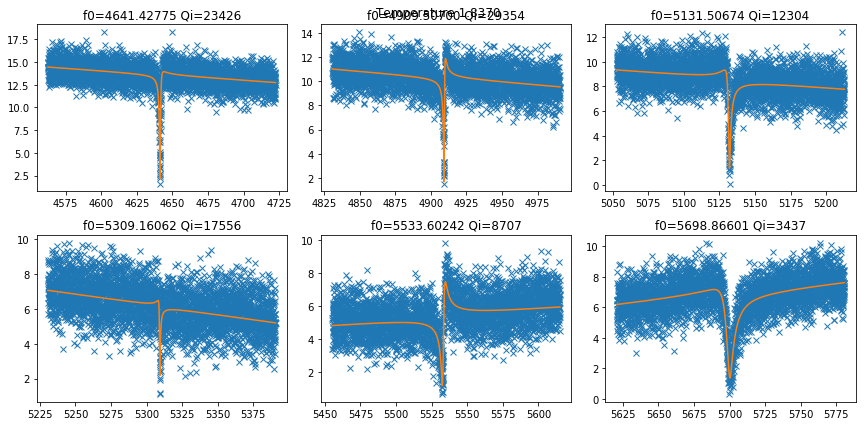

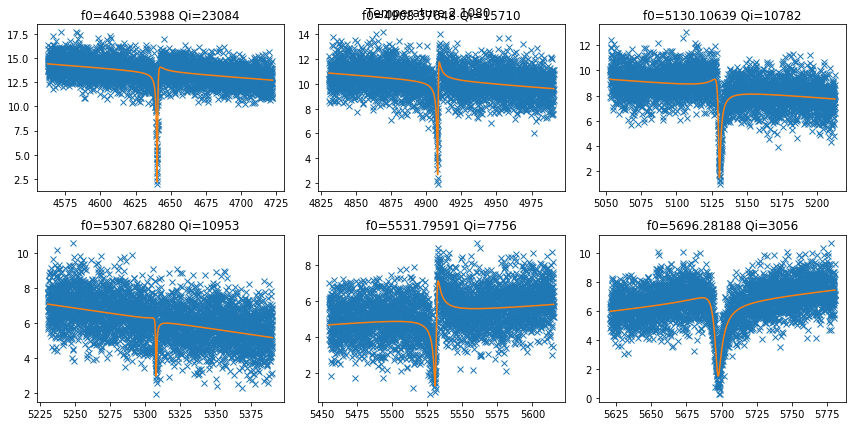

In [45]:
N = 46 #set the amount of sweeps
db_id = 98 #set the database id
f, P, phase, S21, T = load_data(db_id, N)
print(np.shape(f))
#now let's get the single resonances from the plot. 
%matplotlib inline
df = 50
freqs = f[0,0,:]
temperatures = T[0,:, 0]

Qi_2 = np.zeros((6,len(temperatures)))
Qc_2 = np.zeros((6,len(temperatures)))
f0_2 = np.zeros((6,len(temperatures)))
Qi_err_2 = np.zeros((6,len(temperatures)))
Qc_err_2 = np.zeros((6,len(temperatures)))
f0_err_2 = np.zeros((6,len(temperatures)))

for T_ind in range(len(temperatures)):
    S21_sweep = S21[0,T_ind,:]
    f0s = np.array([4642.48477419, 4910.73860518, 5132.80162742, 5310.60959337,
       5535.23310231, 5700.67908268])
    plt.figure(figsize=(12,6))
    for i in range(len(f0s)):
        plt.subplot(2,3,i+1)
        #get the range of frequencies around f0
        indices = np.where((freqs > f0s[i] - df) & (freqs < f0s[i] + df))
        freq_slice = freqs[indices]
        plt.plot(freq_slice, np.abs(S21_sweep[indices]), 'x' )
        pars, result, hanger_model, fit_report = res.fit_hanger(freq_slice, S21_sweep[indices], True, fit_report=False) #p0_sloped)
        plt.plot(freq_slice,np.abs(res.hanger_S21_sloped(*[pars[key].value for key in pars.valuesdict()][0:9])))
        plt.title('f0=%.5f Qi=%d' % (pars['f0'].value,pars['Qi'].value))
        
        Qi_2[i,T_ind] = pars['Qi'].value
        Qc_2[i,T_ind] = pars['Qc'].value
        f0_2[i,T_ind] = pars['f0'].value
        Qi_err_2[i,T_ind] = pars['Qi'].stderr
        Qc_err_2[i,T_ind] = pars['Qc'].stderr
        f0_err_2[i,T_ind] = pars['f0'].stderr
        
    plt.suptitle('Temperature %.4f' % temperatures[T_ind])
    plt.tight_layout()

Text(0.5, 1.0, 'Temperature dependence of external Q')

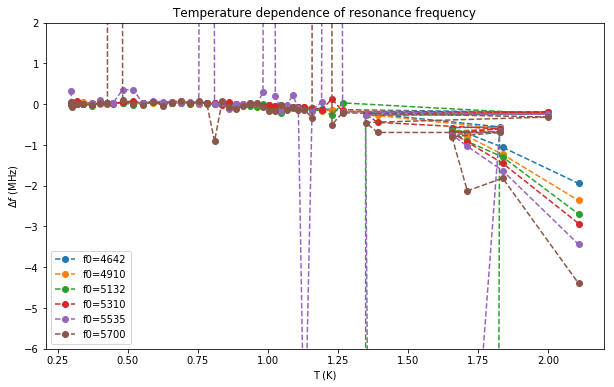

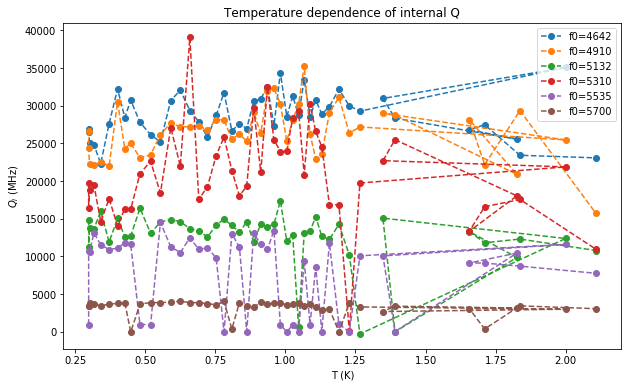

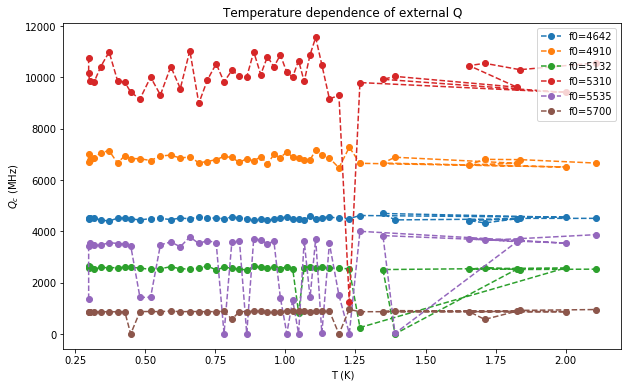

In [48]:
plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,f0_2[i,:]-f0s[i],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylim(-6,2)
plt.ylabel('$\Delta f$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of resonance frequency')

plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,Qi_2[i,:],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylabel('$Q_i$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of internal Q')

plt.figure(figsize=(10,6))
for i in range(0,len(f0s)):
    plt.plot(temperatures,Qc_2[i,:],'o--', label='f0=%d' % f0s[i])
plt.legend()
plt.ylabel('$Q_c$ (MHz)')
plt.xlabel('T (K)')
plt.title('Temperature dependence of external Q')